### Western Wheat Analysis

###### Brian Stampe
###### May 3rd 2019

In [1]:
%matplotlib inline
import pymc3 as pm
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from theano import tensor as tt
import seaborn as sns
import scipy

%config InlineBackend.figure_format = 'retina'
plt.style.use(['seaborn-colorblind', 'seaborn-darkgrid'])

/home/brian/anaconda2/envs/py36/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [14]:
datapath = '/home/brian/WesternWheat/Data/Processed/stripped_mini_maxseason_labeled_df_23.csv'
#datapath = '/home/brian/WesternWheat/Data/Processed/maxdf_23.csv'
datapath = '/home/brian/WesternWheat/Data/Processed/stripped_max_labeled_df_23.csv'

df = pd.read_csv(datapath)

In [15]:
pd.unique(df.pixel).size

874

In [16]:
########
# I want a climate distance matrix
# need distance between each farm and all combinations of farms
########

unique_farms = pd.unique(df.pixel)
df_means = df # create new df to manipulate
df_means =  df.set_index('pixel')

In [17]:
df_means = df_means[~df_means.index.duplicated(keep='first')] # only keep unique index values

farm_idx = df.pixel.values.astype(int)
unique_farm_idx = np.unique(farm_idx)
N_farms = pd.unique(df.pixel).size

print ("unique number of farms: \n", N_farms)
print ("\naverage observations per farm: \n", np.round(farm_idx.size/N_farms,2))
#####################################
# reindexing pixels from 0-Nfarms
#####################################

zero_farm_idx = np.zeros_like(farm_idx)

for i,farm in enumerate(unique_farm_idx):
        for j in np.where(farm_idx == farm): 
            zero_farm_idx[j] = i   
            
##########################################################
# This keeps order only becuase df is sorted by farm_idx
#########################################################

df['farm'] = zero_farm_idx
#df.farm.head(10)


unique number of farms: 
 874

average observations per farm: 
 5.96


###### Climate input space to calculate "distance" for covariance function

In [18]:
# normalize across space not just time 
df_means['zprmean'] = (df_means.prsum3mean-df_means.prsum3mean.mean())/df_means.prsum3mean.std()
df_means['zvpdmean'] = (df_means.vpdmean3mean - df_means.vpdmean3mean.mean())/df_means.vpdmean3mean.std()
df_means['zdrydaysmean'] = (df_means.drydaysmean3mean - df_means.drydaysmean3mean.mean())/\
                            df_means.drydaysmean3mean.std()
df_means['zsradmean'] = (df_means.sradmean3mean - df_means.sradmean3mean.mean())/df_means.sradmean3mean.std()
df_means['zndvimean'] = (df_means.NDVIsum3mean - df_means.NDVIsum3mean.mean())/df_means.NDVIsum3mean.std()


#sns.pairplot(df_means,x_vars=['zprmean','zvpdmean','zdrydaysmean','zsradmean'], 
#             y_vars=['zprmean','zvpdmean','zdrydaysmean','zsradmean']);
#sns.pairplot(df_means,x_vars=['prsum3mean','vpdmean3mean','drydaysmean3mean','sradmean3mean'], 
#             y_vars=['prsum3mean','vpdmean3mean','drydaysmean3mean','sradmean3mean']);


In [19]:
sns.pairplot?

/home/brian/anaconda2/envs/py36/lib/python3.6/site-packages/seaborn/axisgrid.py:2065: UserWarning: The `size` parameter has been renamed to `height`; pleaes update your code.
  warnings.warn(msg, UserWarning)


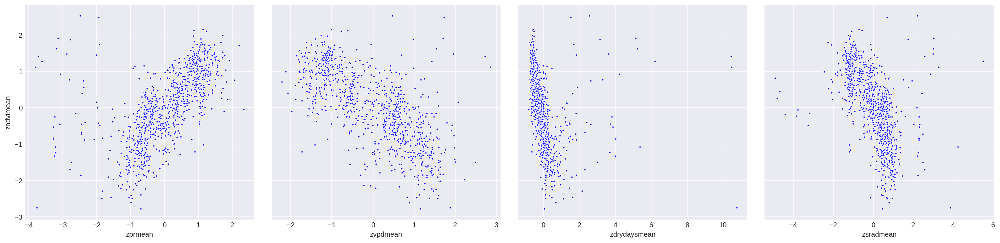

In [20]:
# as predictors for ndvi
sns.pairplot(df_means, x_vars=['zprmean','zvpdmean','zdrydaysmean','zsradmean'],
             y_vars = 'zndvimean', plot_kws=dict(s=8,color='blue'), size=5);

### Attempt at Gaussian Process

The goal here will be to use climate distances to define the similarity by which farms should respond. This will influence how the prior is found for each farm. Thus, a unique prior for each farm that has been informed by my assumption that farms close together in climate space should have a similar slope/sensitivity. 

In [21]:
#dfm = df_means[['zprmean','zvpdmean','zdrydays','zsrad']]

df_means.columns

Index(['Unnamed: 0', 'zNDVIsum3', 'zvpdmean3', 'zprsum3', 'zdrydaysmean3',
       'zGDDsum3', 'zsradmean3', 'ztmmxplussum3', 'Latitude', 'Longitude',
       'year', 'month', 'NDVIsum3mean', 'vpdmean3mean', 'prsum3mean',
       'sradmean3mean', 'drydaysmean3mean', 'zprmean', 'zvpdmean',
       'zdrydaysmean', 'zsradmean', 'zndvimean'],
      dtype='object')

In [22]:
from scipy.spatial import distance_matrix

dfm = df_means[['zprmean','zvpdmean']]
df_dist = pd.DataFrame(distance_matrix(dfm.values, dfm.values), index=dfm.index, columns=dfm.index)
# more dimensions gives me larger distances and less corr between  farms. 
dfm = df_means[['zprmean','zvpdmean','zdrydaysmean','zsradmean']]
df_dist = pd.DataFrame(distance_matrix(dfm.values, dfm.values), index=dfm.index, columns=dfm.index)
    
###########################
# climate distance matrix
###########################

Dmat_ = df_dist.values
Dmatsq = np.power(Dmat_, 2)

Num_farms  = df_dist.shape[0]

In [23]:
df_dist.iloc[:100,:100].describe()

pixel,60.0,317.0,327.0,396.0,437.0,445.0,510.0,524.0,550.0,570.0,...,5056.0,5071.0,5074.0,5252.0,5324.0,5349.0,5558.0,5612.0,5635.0,5695.0
count,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,...,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
mean,2.341998,1.658229,1.760069,1.770366,4.168013,1.687597,1.734392,2.862608,1.900519,2.508916,...,2.540808,1.826532,1.916288,1.804522,1.886719,1.874670,1.855351,2.213354,2.056395,1.815084
std,1.551455,1.112570,1.058591,1.186113,0.899804,1.119035,1.231775,1.663579,1.335598,1.544589,...,1.515339,1.024143,1.351670,1.230204,1.004761,1.317839,1.024912,1.458012,1.370101,1.299215
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.119833,1.039098,1.069323,0.977976,3.617191,0.939046,0.727151,1.654265,0.662175,1.297275,...,1.195305,1.091300,0.672268,0.978026,1.280683,0.779871,1.131659,0.996462,0.787373,0.710880
50%,2.473106,1.546262,1.696070,1.552360,4.080182,1.357118,1.367350,3.127573,1.707092,2.602855,...,2.400909,1.559759,1.591123,1.640468,1.675911,1.535026,1.557606,2.323352,1.879621,1.609893
75%,3.377023,2.067468,2.145795,2.283599,4.555301,2.471440,2.792411,3.983547,3.077243,3.513420,...,3.520758,2.599643,3.142940,2.396265,2.313534,3.127881,2.553290,3.164574,3.279158,2.960514
max,8.731508,7.631557,7.393466,7.926557,8.901992,6.706176,6.532999,9.379164,6.324590,8.753450,...,8.908792,6.337029,6.134410,7.935257,6.957037,6.413694,6.450611,8.542339,6.319663,6.252363


In [24]:
with pm.Model() as GP:
    
    # ====== covariance matrix ========
    etasq = pm.HalfCauchy('etasq', 1) #
    rhosq = pm.HalfCauchy('rhosq', 1) # determines rate of covariance decline between farms
    Kij = etasq*(tt.exp(-rhosq*Dmatsq)+np.diag([.01]*Num_farms))
    
    # ==== group prior =======
    #w_bar = pm.MvNormal('w_bar',0)
    
    # === adaptive prior =====
    #w_i = pm.MvNormal('w_i', w)
    
    # ==== gaussian prior =======
    g = pm.MvNormal('g', mu=np.zeros(Num_farms), cov=Kij, shape=Num_farms)
    a = pm.Normal('a', 0, 2, shape=Num_farms)
    ####### Linear Model ############### 
    u = a[zero_farm_idx]  + g[zero_farm_idx]*df.zprsum3 
    ############ Likelihood ############
    sigma = pm.Uniform('sigma', 0,2)
    y = pm.Normal('Greenness', mu=u, sd=sigma, observed=df.zNDVIsum3) 

# reparameterization of original GP
with pm.Model() as GP_:
    etasq = pm.HalfCauchy('etasq', .3) # this could be more informed
    rhosq = pm.HalfCauchy('rhosq', .3) # this could be more informed
    Kij = etasq*(tt.exp(-rhosq*Dmatsq)+np.diag([.1]*Num_farms)) # this error should prob be larger
    
    # ==== group prior =======
    #w_bar = pm.MvNormal('w_bar',0)
    # === adaptive prior =====
    #w_i = pm.MvNormal('w_i', w)
    
    # ==== GAUSSIAN PRIOR =======
    # g = pm.MvNormal('g', mu=np.zeros(Num_farms), cov=Kij, shape=Num_farms)
    gmu = pm.Normal('gmu', 0., 1., shape=Num_farms)
    # to sample from MvN multiply L N(0,1) where LL^T = K
    g = pm.Deterministic('g', tt.dot(tt.slinalg.cholesky(Kij), gmu))
    # === intercept prior ========                                 
    a = pm.Normal('a', 0, .1, shape=Num_farms) # intercepts should be zero with zscores
    ####### Linear Model ############### 
    u = a[zero_farm_idx]  + g[zero_farm_idx]*df.zprsum3 
    ############ Likelihood ############
    sigma = pm.Uniform('sigma', 0,2)
    y = pm.Normal('Greenness', mu=u, sd=sigma, observed=df.zNDVIsum3) 


"""
with pm.Model() as student_t:
    # need to put k(X,X) in here  ...
    ####### large group hyperprior ##########
    w_bar = pm.Normal('w_bar',mu=0,sd=3,shape=2)
    
    ######## Covariance Matrix Priors ######
    sd_dist = pm.HalfCauchy.dist(beta=1) 
    packed_chol = pm.LKJCholeskyCov('chol_cov', eta=1, n=2, sd_dist=sd_dist)
    ####### compute covariance matrix #####
    chol = pm.expand_packed_triangular(2, packed_chol, lower=True)
    Sigma_bar = pm.Deterministic('Sigma_bar',tt.dot(chol, chol.T))
    
    ######################################
    ##### adaptive farm level prior #####
    #####################################
    w_i = pm.MvNormal('w_i',w_bar,Sigma_bar,shape=(N_farms,2))
    
    ####### Linear Model ###############
    NDVI_pred = df.zprsum3.values*w_i[:,1][zero_farm_idx] + w_i[:,0][zero_farm_idx]
    
    ############ Likelihood ############
    sigma_ndvi = pm.InverseGamma('sigma_ndvi', alpha=3.,beta=1)
    NDVI_i = pm.StudentT('NDVI', nu=5, mu=NDVI_pred, sd=sigma_ndvi, observed=df.zNDVIsum3)


with pm.Model() as empiricalbayes:

    #w_bar=np.array([np.mean(a0), np.mean(b0)]) 
    w_bar = np.array([0.007817374456525517, 0.24509224385384976])
    # function below outputs a0,b0 slopes and intercepts
    # from normal non hierarchical regression
    #Sigma_bar = np.cov(a0,b0) # 
    Sigma_bar =np.array([[0.00217143, 0.00454472],
                        [0.00454472, 0.05330569]])
    
    w_i = pm.MvNormal('w_i',w_bar,Sigma_bar,shape=(N_farms,2))
    sigma_ndvi = pm.InverseGamma('sigma_ndvi', alpha=3.,beta=1)
    
    NDVI_pred = df.zprsum3.values*w_i[:,1][zero_farm_idx] + w_i[:,0][zero_farm_idx]
    NDVI_i = pm.Normal('NDVI', mu=NDVI_pred, sd=sigma_ndvi, observed=df.zNDVIsum3)

"""

"\nwith pm.Model() as student_t:\n    ####### large group hyperprior ##########\n    w_bar = pm.Normal('w_bar',mu=0,sd=3,shape=2)\n    \n    ######## Covariance Matrix Priors ######\n    sd_dist = pm.HalfCauchy.dist(beta=1) \n    packed_chol = pm.LKJCholeskyCov('chol_cov', eta=1, n=2, sd_dist=sd_dist)\n    ####### compute covariance matrix #####\n    chol = pm.expand_packed_triangular(2, packed_chol, lower=True)\n    Sigma_bar = pm.Deterministic('Sigma_bar',tt.dot(chol, chol.T))\n    \n    ######################################\n    ##### adaptive farm level prior #####\n    #####################################\n    w_i = pm.MvNormal('w_i',w_bar,Sigma_bar,shape=(N_farms,2))\n    \n    ####### Linear Model ###############\n    NDVI_pred = df.zprsum3.values*w_i[:,1][zero_farm_idx] + w_i[:,0][zero_farm_idx]\n    \n    ############ Likelihood ############\n    sigma_ndvi = pm.InverseGamma('sigma_ndvi', alpha=3.,beta=1)\n    NDVI_i = pm.StudentT('NDVI', nu=5, mu=NDVI_pred, sd=sigma_ndvi, o

In [54]:
with empiricalbayes:
    trace_empiricalbayes = pm.sample(500, tune=500)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [NDVI_missing, sigma_ndvi, w_i]
Sampling 4 chains: 100%|██████████| 4000/4000 [05:02<00:00, 26.01draws/s]
The acceptance probability does not match the target. It is 0.6771743588914644, but should be close to 0.8. Try to increase the number of tuning steps.
The acceptance probability does not match the target. It is 0.6880161070825612, but should be close to 0.8. Try to increase the number of tuning steps.


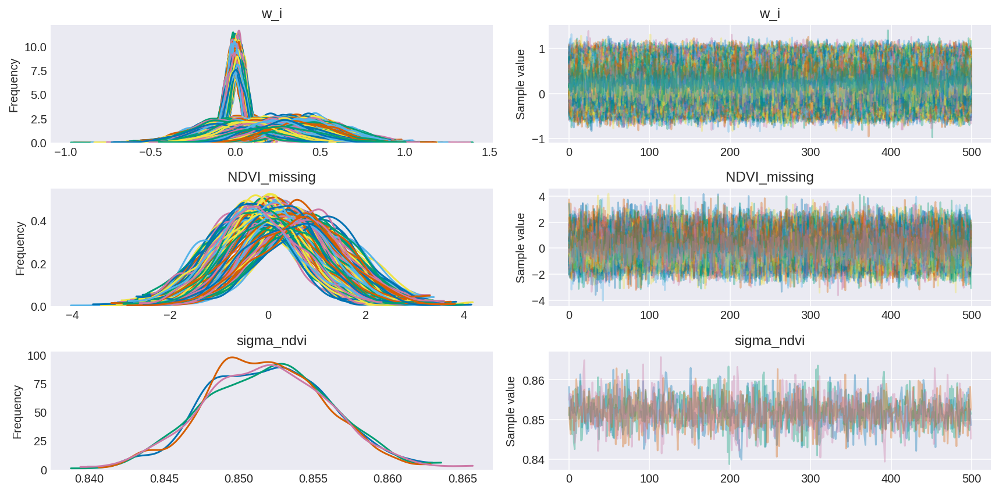

In [55]:
pm.traceplot(trace_empiricalbayes);

In [83]:
with GP:
    trace_GP = pm.sample(500, tune=100)
    

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, a, g, rhosq, etasq]
Sampling 4 chains: 100%|██████████| 2400/2400 [07:19<00:00,  3.32draws/s]
The acceptance probability does not match the target. It is 0.6119212239473294, but should be close to 0.8. Try to increase the number of tuning steps.
The acceptance probability does not match the target. It is 0.7128357003484648, but should be close to 0.8. Try to increase the number of tuning steps.
The estimated number of effective samples is smaller than 200 for some parameters.


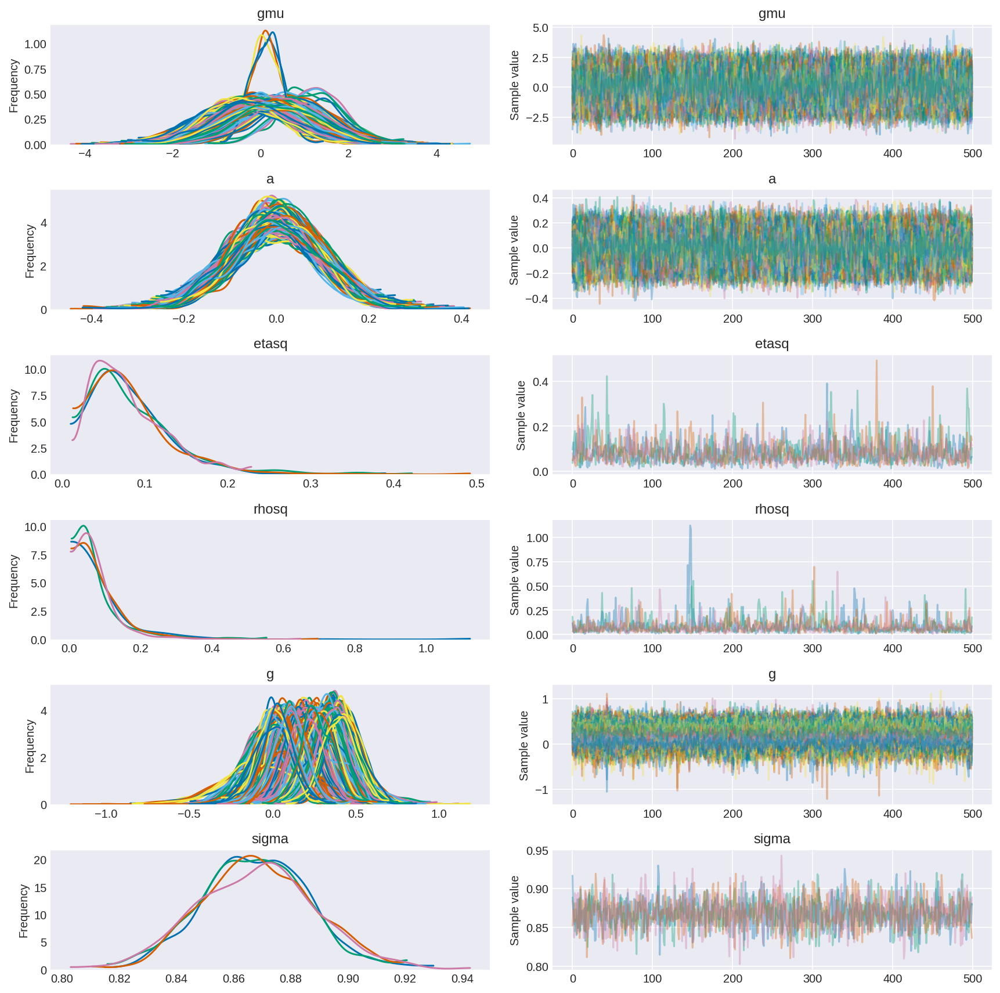

In [82]:
#pm.summary(trace_1)
pm.traceplot(trace_GP);

In [25]:
# noncentered parameterization
with GP_:
    trace_GP_ = pm.sample(500, tune=100)


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, a, gmu, rhosq, etasq]
Sampling 4 chains:   2%|▏         | 39/2400 [05:59<6:33:29, 10.00s/draws] 


ValueError: Not enough samples to build a trace.

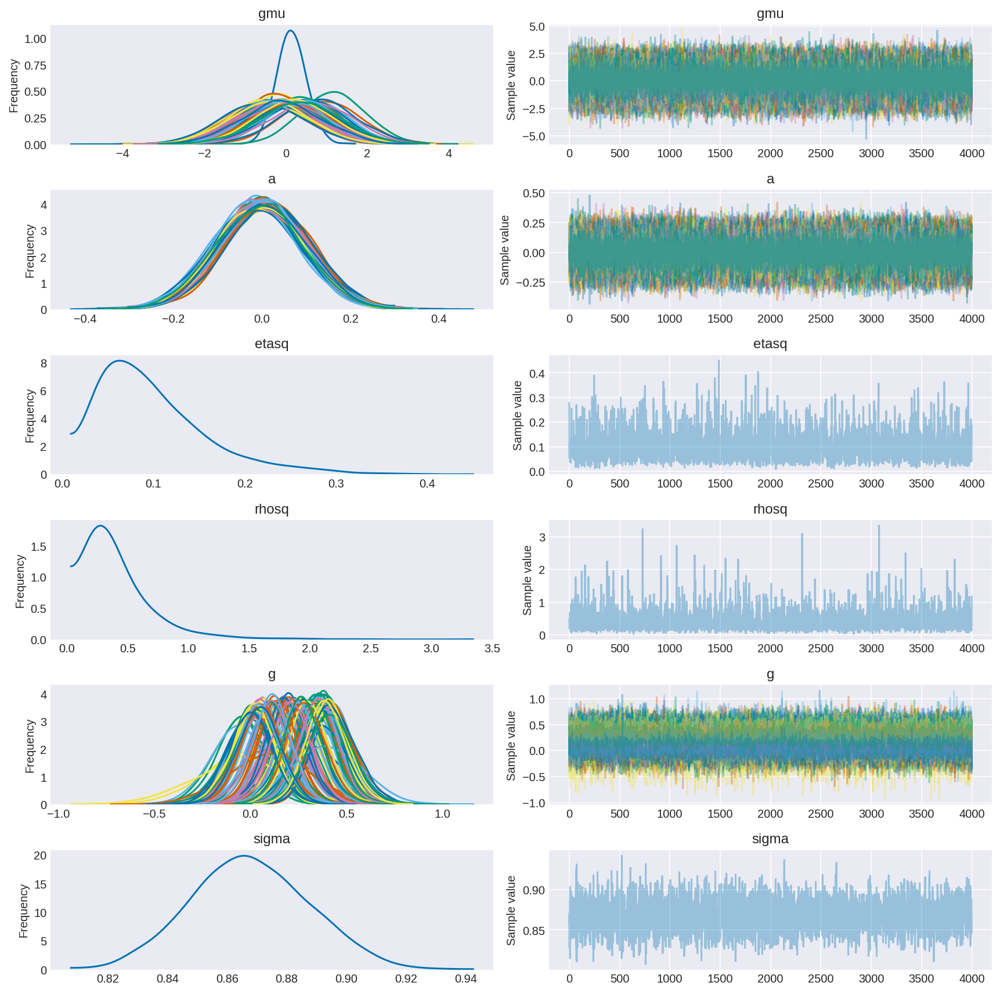

In [36]:
pm.traceplot(trace_GP_, combined=True);

In [49]:
with student_t:
    trace_student = pm.sample(1000, tune=500)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma_ndvi, w_i, chol_cov, w_bar]
Sampling 4 chains: 100%|██████████| 6000/6000 [01:45<00:00, 56.75draws/s] 
There were 188 divergences after tuning. Increase `target_accept` or reparameterize.
There were 29 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.6300040030646127, but should be close to 0.8. Try to increase the number of tuning steps.
There were 637 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.31950123719697004, but should be close to 0.8. Try to increase the number of tuning steps.
There were 25 divergences after tuning. Increase `target_accept` or reparameterize.
The gelman-rubin statistic is larger than 1.2 for some parameters.
The estimated number of effective samples is smaller th

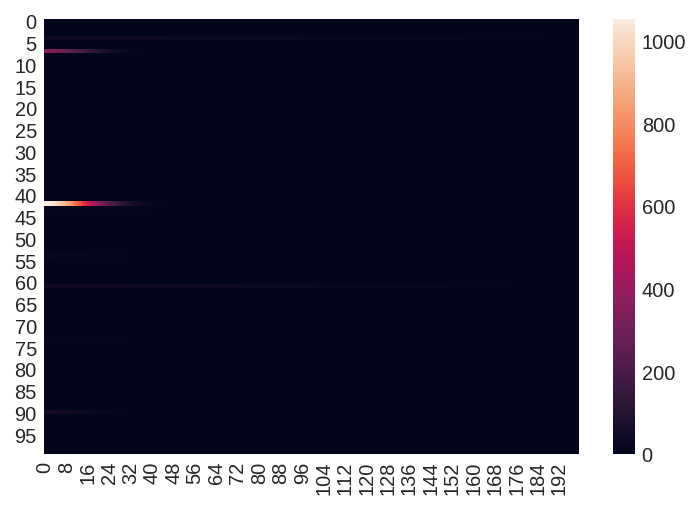

In [42]:
import scipy.stats as st
# prior covariance function
size =1000
etasq = st.halfcauchy.rvs(loc=0, scale=.3, size=100)**2
rhosq = st.halfcauchy.rvs(loc=0, scale=.3, size=100)**2


xrange = np.linspace(0,20,200)
#XDmatsq = distance_matrix(x=x,y=x)
K = etasq[:,None]*(np.exp(-rhosq[:,None]*xrange**2 ))

#plt.hist(etasq);

sns.heatmap(K);
#-rhosq[:,None]*xrange**2 

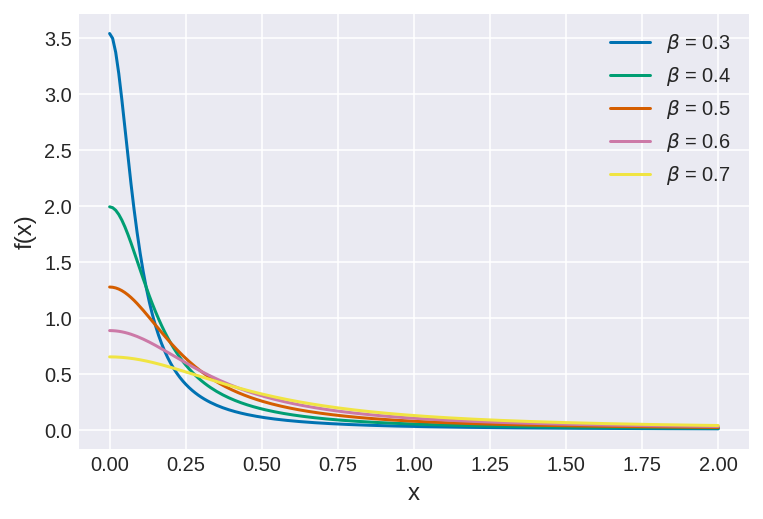

In [180]:

import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as st
plt.style.use('seaborn-darkgrid')
x = np.linspace(0, 2, 200)
for b in [.3,.4,.5,.6,.7]:
    pdf = st.cauchy.pdf(x, scale=b**2)
    plt.plot(x, pdf, label=r'$\beta$ = {}'.format(b))
plt.xlabel('x', fontsize=12)
plt.ylabel('f(x)', fontsize=12)
plt.legend(loc=1)
plt.show()

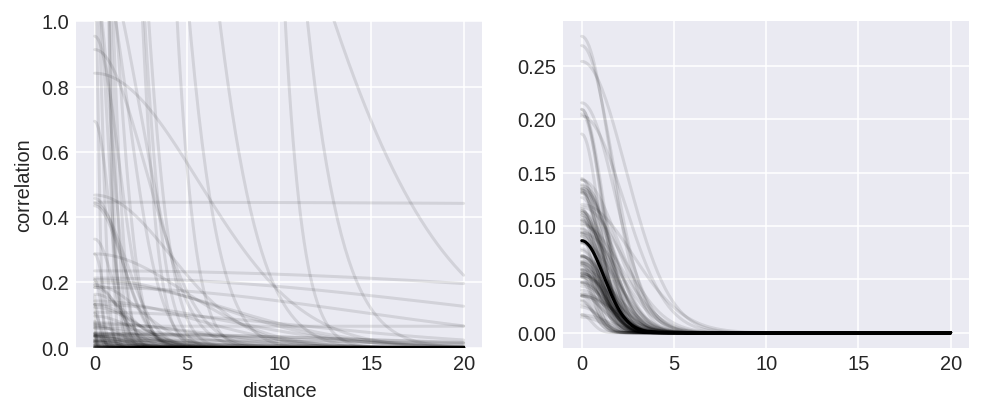

In [41]:
post = pm.trace_to_dataframe(trace_GP_, varnames=['g', 'a', 'etasq', 'rhosq'])
post_etasq = post['etasq'].values
post_rhosq = post['rhosq'].values



_, ax = plt.subplots(1, 2, figsize=(8, 3))
xrange = np.linspace(0, 20, 200)

ax[1].plot(xrange, np.median(post_etasq) * np.exp(-np.median(post_rhosq) * xrange**2), 'k')
ax[1].plot(xrange, (post_etasq[:100][:, None] * np.exp(-post_rhosq[:100][:, None] * xrange**2)).T,
        'k', alpha=.1)
ax[0].plot(xrange, K.T, 'k', alpha=.1)


ax[0].set_ylim(0, 1)
ax[0].set_xlabel('distance')
ax[0].set_ylabel('covariance');

In [42]:
# compute posterior median covariance among farms
Kij_post = np.median(post_etasq) * (np.exp(-np.median(post_rhosq) * Dmatsq) + np.diag([.01] * Num_farms))

In [45]:
# convert to correlation matrix
sigma_post = np.diag(np.sqrt(np.diag(Kij_post)))
Rho = np.linalg.inv(sigma_post)@Kij_post@np.linalg.inv(sigma_post)
# add row/col names for convenience
Rho = pd.DataFrame(Rho)#, index=str(unique_farms))#,columns=unique_farms)
                  

Rho.round(2)
# sns.heatmap(Rho)

,0,1,2,3,4,5,6,7,8,9,...,154,155,156,157,158,159,160,161,162,163
0,1.00,0.91,0.85,0.93,0.64,0.76,0.71,0.97,0.66,0.99,...,0.98,0.99,0.98,0.57,0.84,0.92,0.75,0.98,0.98,0.88
1,0.91,1.00,0.98,0.98,0.54,0.93,0.91,0.83,0.86,0.89,...,0.92,0.88,0.84,0.77,0.97,0.98,0.92,0.96,0.93,0.98
2,0.85,0.98,1.00,0.96,0.46,0.95,0.93,0.76,0.88,0.83,...,0.88,0.82,0.78,0.80,0.97,0.95,0.93,0.92,0.88,0.97
3,0.93,0.98,0.96,1.00,0.57,0.91,0.87,0.88,0.82,0.91,...,0.96,0.91,0.89,0.72,0.96,0.97,0.87,0.97,0.96,0.97
4,0.64,0.54,0.46,0.57,1.00,0.49,0.46,0.63,0.47,0.64,...,0.59,0.61,0.64,0.42,0.55,0.62,0.50,0.59,0.63,0.56
5,0.76,0.93,0.95,0.91,0.49,1.00,0.98,0.66,0.95,0.73,...,0.79,0.71,0.68,0.90,0.98,0.92,0.95,0.84,0.80,0.95
6,0.71,0.91,0.93,0.87,0.46,0.98,1.00,0.61,0.97,0.68,...,0.74,0.67,0.63,0.92,0.96,0.89,0.95,0.80,0.76,0.93
7,0.97,0.83,0.76,0.88,0.63,0.66,0.61,1.00,0.55,0.96,...,0.96,0.98,0.99,0.46,0.75,0.85,0.64,0.93,0.96,0.80
8,0.66,0.86,0.88,0.82,0.47,0.95,0.97,0.55,1.00,0.63,...,0.67,0.61,0.57,0.93,0.93,0.86,0.95,0.74,0.70,0.90
9,0.99,0.89,0.83,0.91,0.64,0.73,0.68,0.96,0.63,1.00,...,0.97,0.98,0.97,0.56,0.81,0.91,0.74,0.96,0.97,0.86


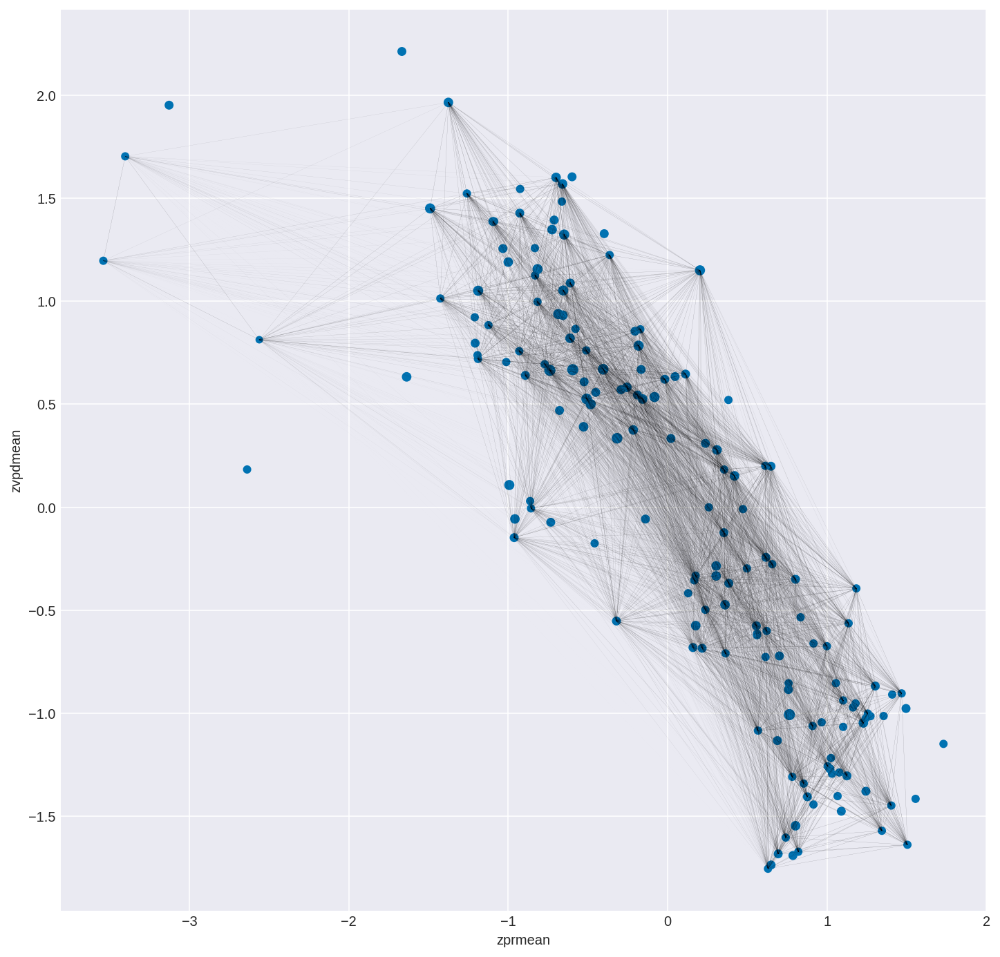

In [194]:
# scale scatter point by how many obs for each farm
farm_counts = df.groupby(df.pixel).count().values[:,0]


_, ax = plt.subplots(1, 1, figsize=(12, 12))
ax.scatter(dfm['zprmean'], dfm['zvpdmean'], farm_counts*5);

part = 2 # subset of connecting lines to draw
alpha_factor = 2 # making more transparent
for i in range(dfm.shape[0]//part):
    for j in np.arange(i+1, dfm.shape[0]//part):
        ax.plot([dfm.zprmean.iloc[i], dfm.zprmean.iloc[j]],
                [dfm.zvpdmean.iloc[i], dfm.zvpdmean.iloc[j]], 'k-', 
                alpha=(Rho.iloc[i, j]**2)/alpha_factor, lw=.1)
ax.set_xlabel('zprmean')
ax.set_ylabel('zvpdmean');

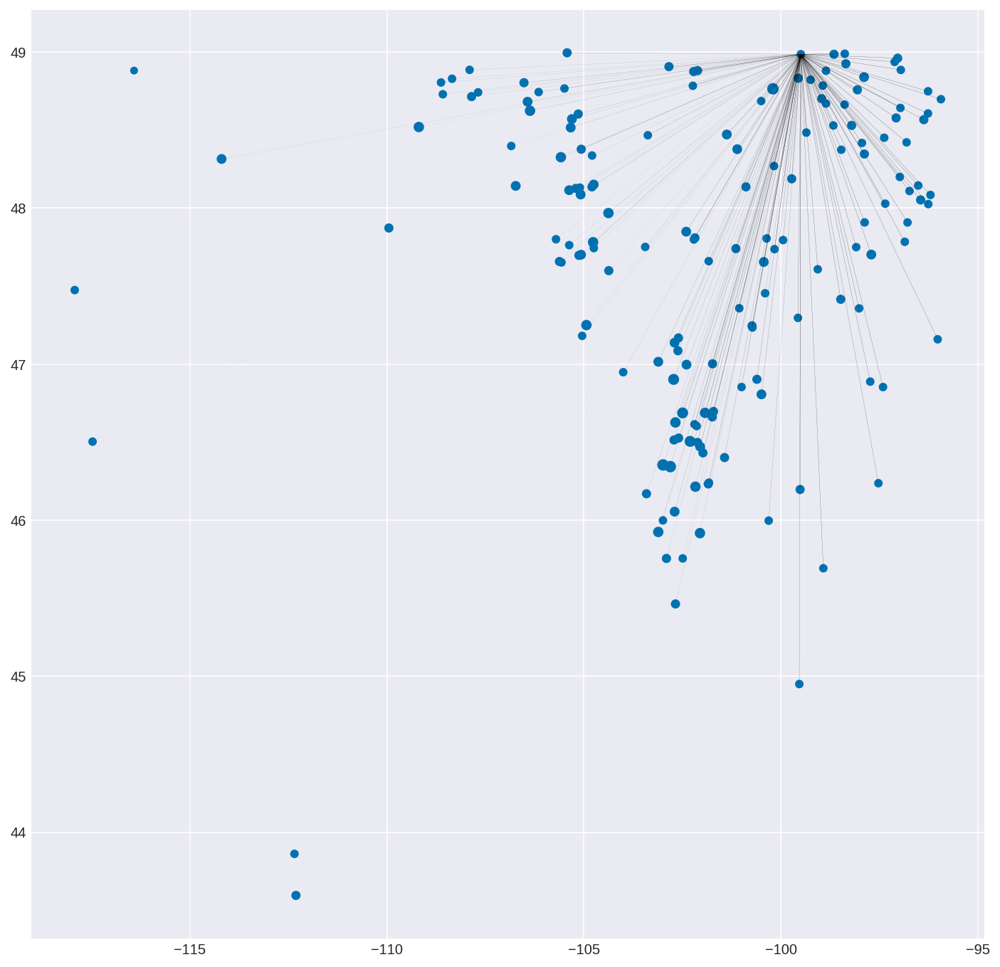

KeyboardInterrupt: 

In [92]:
# scale scatter point by how many obs for each farm
farm_counts = df.groupby(df.pixel).count().values[:,0]

# plot RHO ontop of lat long, even though used climate to define distance matrix
_, ax = plt.subplots(1, 1, figsize=(12, 12))
ax.scatter(df_means['Longitude'], df_means['Latitude'], farm_counts*5);
plt.ion() # dynamically pop up on plot since takes so long to plot

part = 1
alpha_factor = 1
for i in range(df_means.shape[0]//part):
    for j in np.arange(i+1, df_means.shape[0]//part):
        ax.plot([df_means.Longitude.iloc[i], df_means.Longitude.iloc[j]],
                [df_means.Latitude.iloc[i], df_means.Latitude.iloc[j]], 'k-', 
                alpha=(Rho.iloc[i, j]**2)/alpha_factor, lw=.1)
    plt.pause()
    
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude');

In [45]:
# my function from westernwheat

def linear_pixel(df, p,c,column_x,column_y, LOO=False, cluster=True):
    """
    =========================================================
    Compute simple OLS pixel wise for given pixel/farm p, and cluster c.
    
    LeaveOneOut implented for CV studies. 
    
    if LOO:
        return mu_params_pixel, C_pixel, y_train, x_train, y_test, x_test, n
    =========================================================
    """
    if cluster:
        dfc = df[df.cluster==c]
        dfp = dfc.loc[dfc.pixel==p]
    else:
        dfp = df.loc[df.pixel==p]
    # first mask out potential nan values
    mask = ~np.isnan(dfp[column_x].values) & ~np.isnan(dfp[column_y].values)
    x = dfp[column_x].values[mask]
    y = dfp[column_y].values[mask]
    
    
    if LOO == True:

        # delete one of the y and x values before fitting line
        
        n = np.random.randint(0,y.shape[0]) # one data point left out of training set
        y_test = y[n]   # selecting n test set
        y = np.delete(y,n)  # erase value indexed at n from training set
        x_test = x[n] # selecting n test data
        x = np.delete(x,n) # delete corresponding x value 
            
    G = np.ones_like(x)
    G = np.array((G,x)).T

    # least squares in matrix form
    A = np.matmul(np.linalg.inv(np.matmul(G.T,G)),  G.T)
    mu_params = np.matmul(A,y)
    mu_params_pixel = mu_params

    # assumption iid normal data errors
    # Cov(ml2) = var*(G.T@G)-1
    C =  y.var() * np.linalg.inv(np.matmul(G.T,G))
    C_pixel = C  
    
    if LOO==True:
        return mu_params_pixel, C_pixel, y, x, y_test, x_test, n
    
    else: 
        return mu_params_pixel, C_pixel
    
    
######
# OLS 
######

#############################################
# compute slope int directly from pixel level
##############################################
a0b0 = []    
for p in unique_farm_idx:
        mu_params,_ = linear_pixel(df,p,c=0,column_x='zprsum3',column_y='zNDVIsum3', cluster=False)
        a0b0.append(mu_params)
        
# OLS results
ab = np.array(a0b0)
a0, b0 = ab[:,0], ab[:,1]

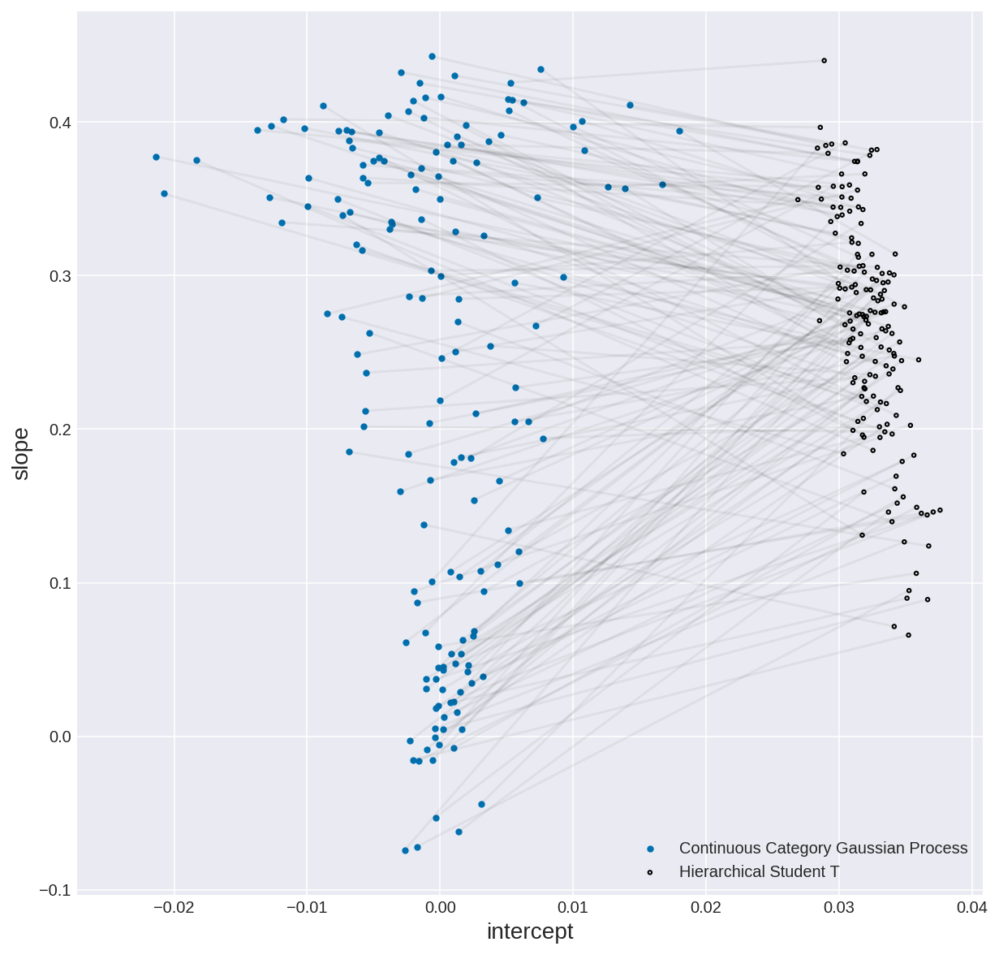

In [50]:

b1 = trace_GP_['g'].mean(axis=0)
a1 = trace_GP_['a'].mean(axis=0)


# extract posterior means of partially pooled estimates
a2b2 = trace_student['w_i'].mean(axis=0)
a2 = a2b2[:, 0]
b2 = a2b2[:, 1]

# plot both and connect with lines
_, ax = plt.subplots(1, 1, figsize=(10,10))
#ax.scatter(a0,b0,label='Ordinary Least Squares', s=10)
ax.scatter(a1, b1, label='Continuous Category Gaussian Process', s=10)
ax.scatter(a2, b2, label='Hierarchical Student T', s=5, 
           facecolors='none', edgecolors='k', lw=1)


#ax.plot([a1, a0], [b1, b0], 'k-', alpha=.05)
ax.plot([a1, a2], [b1, b2], 'k-', alpha=.05)
ax.set_xlabel('intercept', fontsize=14)
ax.set_ylabel('slope', fontsize=14)
#ax.set_title('studentT = .3 vs. studentT sigma=RV')
#ax.set_xlim(-.3,.3)
#ax.set_ylim(-.5,.5)
ax.legend();

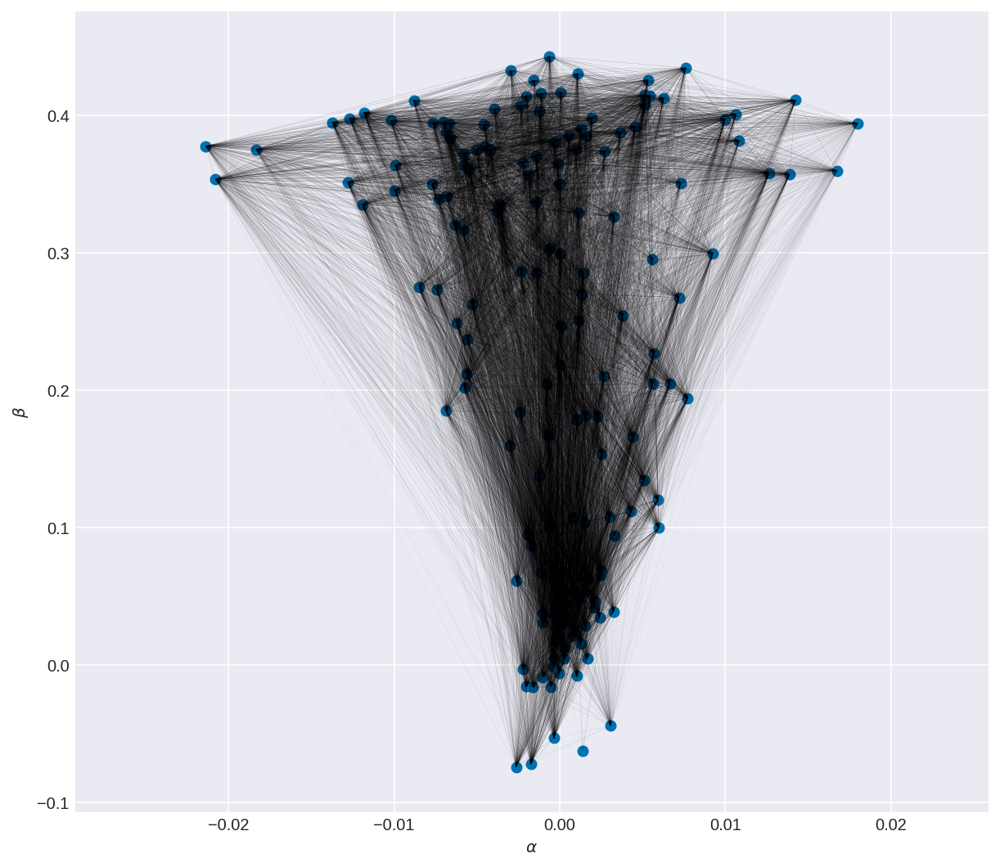

In [48]:
_, ax = plt.subplots(1, 1, figsize=(10,9))
ax.scatter(a1,b1)

part = 1 # subset of connects to draw
alpha_factor = 2 # making more transparent
for i in range(dfm.shape[0]//part):
    for j in np.arange(i+1, dfm.shape[0]//part):
        ax.plot([a1[i], a1[j]],
                [b1[i], b1[j]], 'k-', 
                alpha=(Rho.iloc[i, j]**2)/alpha_factor, lw=.1)
        
ax.set_xlabel(r'$\alpha$')
ax.set_ylabel(r'$\beta$');

## Hierarchical Model

#####  Lets do a proper bayesian hierarchical model on this wheat data
###### I will use the farm as the individual unit and all spring wheat as the upper unit

This differs slightly in my research in the sense I use a subset of spring wheat as the upper level of the hierarchcy. The logic is that one would expect wheat in similar climates to respond similarly to differences in weather. Both from the obvious sense, that I have defined zscores based at the farm level. And from a scientific sense, that both the wheat and farmers will likely have adjusted/adapted to their specific conditions. And that alterations from those condtions may have similar limiting factors in similar climates. I.E. water limitations, energy limitations, pest limitations on final accumulated sesonal greenness. 

In [4]:
#### wheat data ####
###### mini #######

datapath = '/home/brian/WesternWheat/Data/Processed/stripped_mini_maxseason_labeled_df_23.csv'
df = pd.read_csv(datapath)

farm_idx = df.pixel.values.astype(int)
unique_farm_idx = np.unique(farm_idx)
N_farms = pd.unique(df.pixel).size

print ("unique number of farms: \n", N_farms)
print ("\naverage observations per farm: \n", np.round(farm_idx.size/N_farms,1))

unique number of farms: 
 164

average observations per farm: 
 5.9


In [5]:
#####################################
# reindexing pixels from 0-Nfarms
#####################################

zero_farm_idx = np.zeros_like(farm_idx)

for i,farm in enumerate(unique_farm_idx):
        for j in np.where(farm_idx == farm): 
            zero_farm_idx[j] = i      



In [6]:
##########################################################
# This keeps order only becuase df is sorted by farm_idx
#########################################################

df['farm'] = zero_farm_idx
#df.farm.head(10)

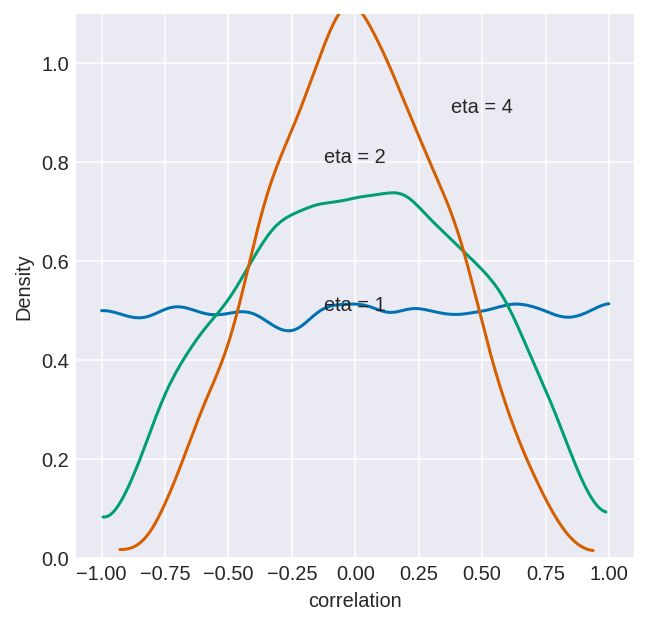

In [420]:
##########################
## corr prior analysis  ##
#########################

_, ax = plt.subplots(1, 1, figsize=(5, 5))
textloc = [[0, .5], [0, .8], [.5, .9]]
for eta, loc in zip([1, 2, 4], textloc):
    R = pm.LKJCorr.dist(n=2, eta=eta).random(size=10000)
    pm.kdeplot(R, ax=ax);
    ax.text(loc[0], loc[1], 'eta = %s'%(eta), horizontalalignment='center')

ax.set_ylim(0, 1.1)
ax.set_xlabel('correlation')
ax.set_ylabel('Density');

In [20]:


with pm.Model() as m_2:
    sd_dist = pm.HalfCauchy.dist(beta=2) 
    packed_chol = pm.LKJCholeskyCov('chol_cov', eta=2, n=2, sd_dist=sd_dist)
    
    # compute the covariance matrix
    chol = pm.expand_packed_triangular(2, packed_chol, lower=True)
    cov = tt.dot(chol, chol.T)
    
    # Extract the standard deviations and rho
    sigma_ab = pm.Deterministic('sigma_farm', tt.sqrt(tt.diag(cov)))
    corr = tt.diag(sigma_ab**-1).dot(cov.dot(tt.diag(sigma_ab**-1)))
    r = pm.Deterministic('Rho', corr[np.triu_indices(2, k=1)])
    
    ab = pm.Normal('ab', mu=0, sd=1, shape=2)  # prior for average intercept and slope
    ab_farm = pm.MvNormal('ab_farm', mu=ab, chol=chol, shape=(N_farms, 2)) # Population of varying effects
    # Shape needs to be (N_farm, 2) because we're getting back both a and b for each farm
    
    mu = ab_farm[:, 0][zero_farm_idx] +\
        ab_farm[:, 1][zero_farm_idx] * df.zprsum3.values  # linear model
    # tried df.zprsum3.values[zero_farm_idx] same total shrinkage result
    
    
    #sd = pm.HalfCauchy('sigma', beta=2)      # prior stddev within farms
    sd = .2
    NDVI = pm.Normal('NDVI', mu=mu, sd=sd, observed=df.zNDVIsum3)  # likelihood
    # tried mu[zero_farm_idx] same result
    
    trace_2 = pm.sample(5000, tune=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [ab_farm, ab, chol_cov]
Sampling 4 chains: 100%|██████████| 24000/24000 [01:20<00:00, 298.12draws/s]


In the linear model:
zero_farm_idx indexes the adaptive prior, b[:,1][0,0,0,0,1,1,1,1,2,2,2,2....] says take the first adaptive prior 4 times. Correct? And each time you take one prior, take an observation in df.zprsum3. The first four obs in df.zprsum3 are aligned with farm index so we are assesing the same farm. What am I missing here?

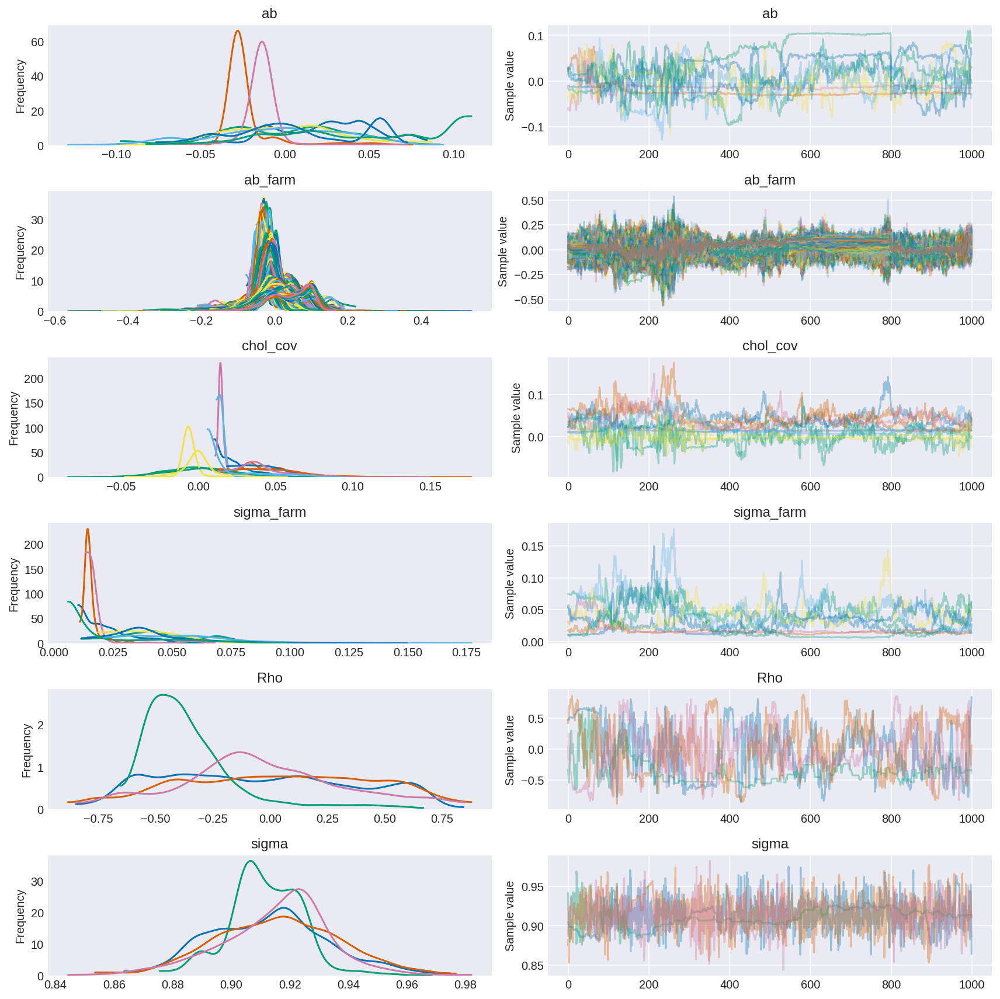

In [8]:
pm.traceplot(trace_2);

In [9]:
post = pm.trace_to_dataframe(trace_2)

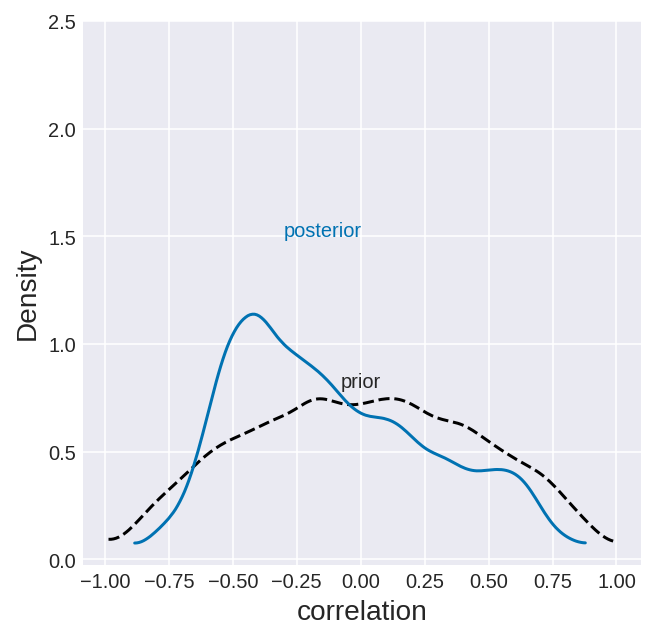

In [10]:
_, ax = plt.subplots(1, 1, figsize=(5, 5))
R = pm.LKJCorr.dist(n=2, eta=2).random(size=10000)
pm.kdeplot(R, ax=ax, color='k', linestyle='--')
ax.text(0, .8, 'prior', horizontalalignment='center')
pm.kdeplot(trace_2['Rho'], ax=ax, color='C0')
ax.text(-.15, 1.5, 'posterior', color='C0', horizontalalignment='center')
ax.set_ylim(-.025, 2.5)
ax.set_xlabel('correlation', fontsize=14)
ax.set_ylabel('Density', fontsize=14);

In [11]:
def linear_pixel(df, p,c,column_x,column_y, LOO=False, cluster=True):
    """
    =========================================================
    Compute simple OLS pixel wise for given pixel/farm p, and cluster c.
    
    LeaveOneOut implented for CV studies. 
    
    if LOO:
        return mu_params_pixel, C_pixel, y_train, x_train, y_test, x_test, n
    =========================================================
    """
    if cluster:
        dfc = df[df.cluster==c]
        dfp = dfc.loc[dfc.pixel==p]
    else:
        dfp = df.loc[df.pixel==p]
    # first mask out potential nan values
    mask = ~np.isnan(dfp[column_x].values) & ~np.isnan(dfp[column_y].values)
    x = dfp[column_x].values[mask]
    y = dfp[column_y].values[mask]
    
    
    if LOO == True:

        # delete one of the y and x values before fitting line
        
        n = np.random.randint(0,y.shape[0]) # one data point left out of training set
        y_test = y[n]   # selecting n test set
        y = np.delete(y,n)  # erase value indexed at n from training set
        x_test = x[n] # selecting n test data
        x = np.delete(x,n) # delete corresponding x value 
            
    G = np.ones_like(x)
    G = np.array((G,x)).T
    # ml2 = [alpha, beta] parameters for least squares
    # ml2 = (G.T@G)-1 @ G.T @ d
    # least squares in matrix form
    A = np.matmul(np.linalg.inv(np.matmul(G.T,G)),  G.T)
    mu_params = np.matmul(A,y)
    mu_params_pixel = mu_params

    #plt.plot(x,mu_params[0]+mu_params[1]*x)
    #plt.show();
    # check
    #stat = stats.linregress(x=x,y=y)
    #plt.plot(x,stat[1]+stat[0]*x);
    
    # variance in y
    # p.31
    #Cov(ml2) = (Gw.T@Gw)-1
    # assumption iid normal data errors
    # Cov(ml2) = var*(G.T@G)-1
    C =  y.var() * np.linalg.inv(np.matmul(G.T,G))
    C_pixel = C  
    
    if LOO==True:
        return mu_params_pixel, C_pixel, y, x, y_test, x_test, n
    
    else: 
        return mu_params_pixel, C_pixel

In [12]:
######
# OLS 
######

#############################################
# compute slope int directly from pixel level
##############################################
a1b1 = []    
for p in unique_farm_idx:
        mu_params,_ = linear_pixel(df,p,c=0,column_x='zprsum3',column_y='zNDVIsum3', cluster=False)
        a1b1.append(mu_params)
        
# OLS results
ab = np.array(a1b1)
a1, b1 = ab[:,0], ab[:,1]

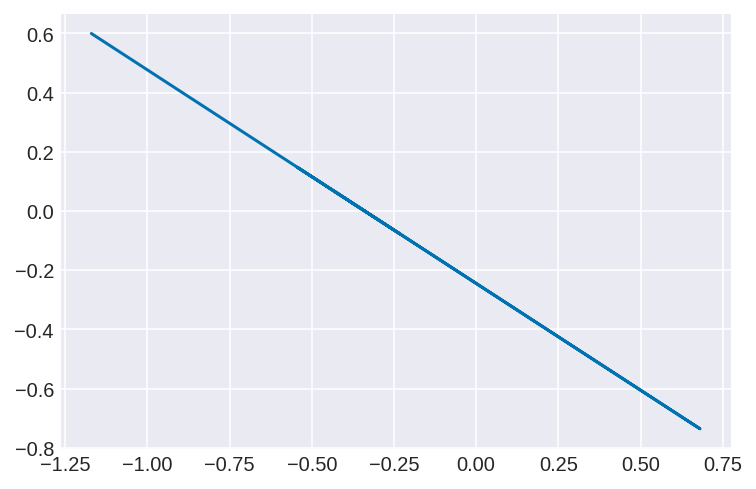

ValueError: Inputs must not be empty.

In [13]:
'''
for i,farm in enumerate(unique_farm_idx):
    if i<3:
        column_x, column_y = 'zprsum3', 'zNDVIsum3'
        mask = ~np.isnan(df[df.farm==farm][column_x].values) & ~np.isnan(df[df.farm==farm][column_y].values)

        x = df[df.farm==farm][column_x].values[mask]
        y = df[df.farm==farm][column_y].values[mask]

        # check
        stat = scipy.stats.linregress(x=x,y=y)
        plt.plot(x,stat[1]+stat[0]*x)
        plt.show();
'''

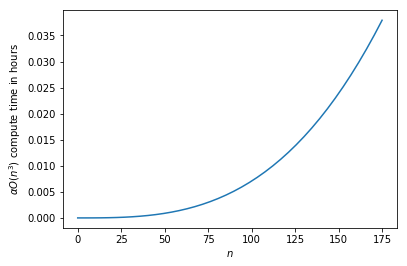

In [28]:
import numpy as np
import matplotlib.pyplot as plt
x = np.linspace(0,175,40)
a = 270/860**3
plt.plot(x,(a * x**3)/60);
plt.ylabel(r'$\alpha O(n^3)$ compute time in hours')
plt.xlabel(r'$n$');

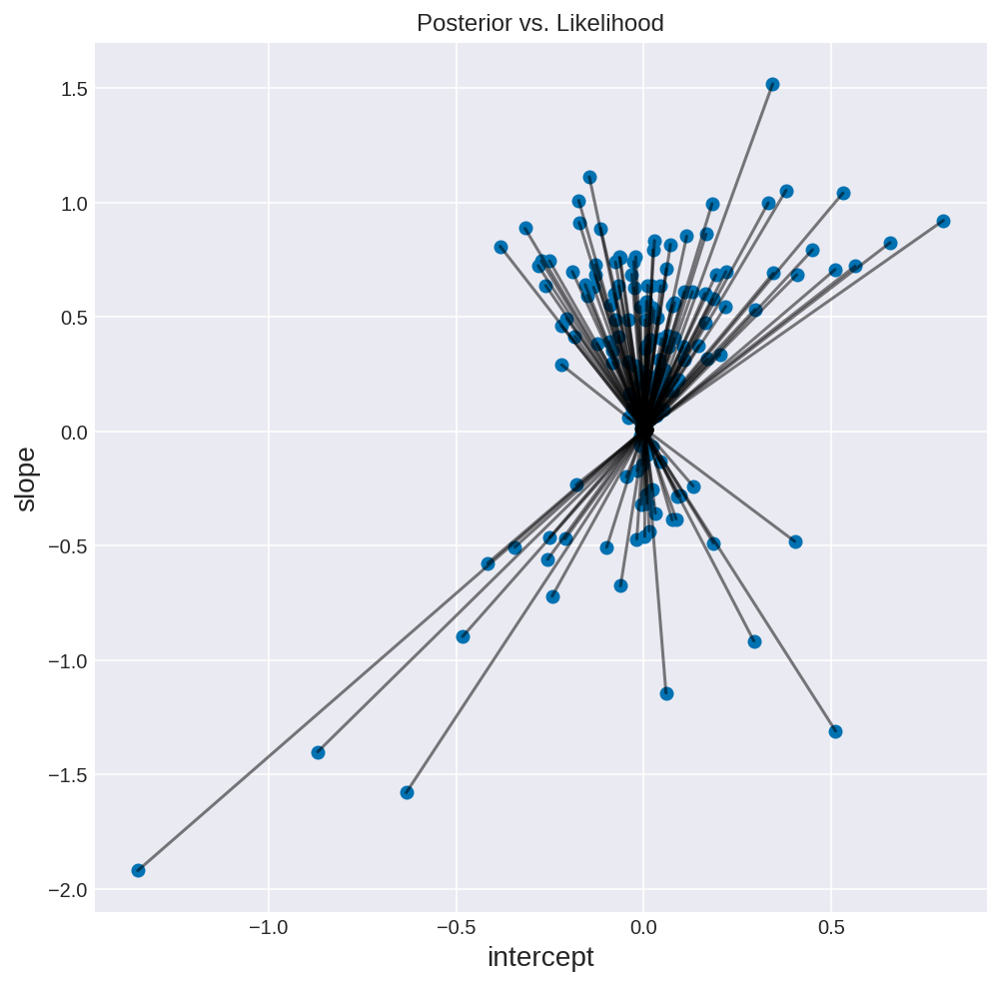

In [15]:

# extract posterior means of partially pooled estimates
a2b2 = trace_2['ab_farm'].mean(axis=0)
a2 = a2b2[:, 0]
b2 = a2b2[:, 1]

# plot both and connect with lines
_, ax = plt.subplots(1, 1, figsize=(8,8))
ax.scatter(a1, b1)
ax.scatter(a2, b2, 
           facecolors='none', edgecolors='k', lw=1)

ax.plot([a1, a2], [b1, b2], 'k-', alpha=.5)
ax.set_xlabel('intercept', fontsize=14)
ax.set_ylabel('slope', fontsize=14)
ax.set_title('Posterior vs. Likelihood');

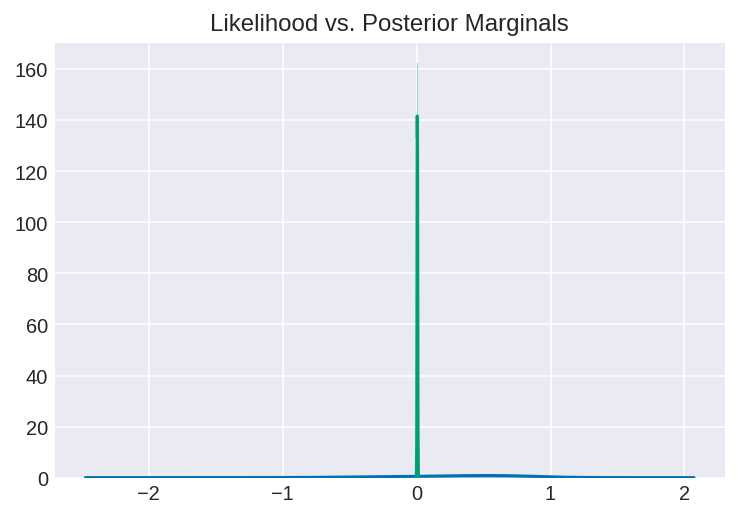

likelihood slope variance:   0.294
posterior slope variance:   0.0
likelihood intercept variance:  0.05
posterior intercept variance:  1e-05


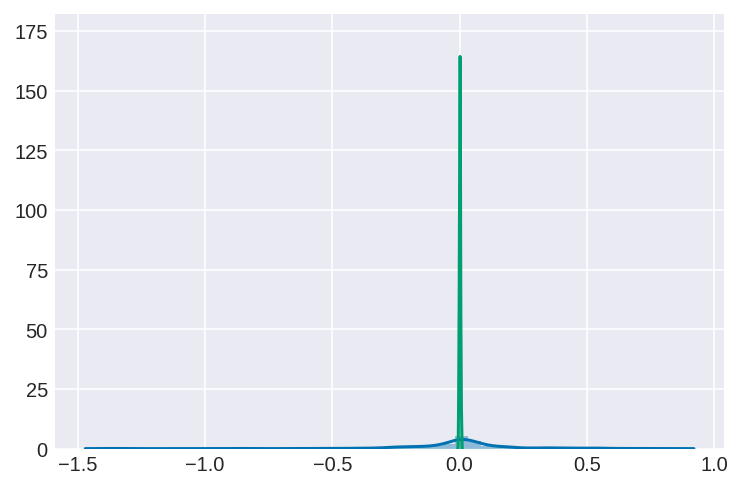

In [16]:
plt.title('Likelihood vs. Posterior Marginals')

sns.distplot(b1,label='slopes')
sns.distplot(b2);
plt.show()
print ('likelihood slope variance:  ', np.round(b1.var(),3))
print ('posterior slope variance:  ', np.round(b2.var(),3))

sns.distplot(a1, label='intercepts')
sns.distplot(a2);

print('likelihood intercept variance: ', np.round(a1.var(),2))
print ('posterior intercept variance: ', np.round(a2.var(),5))

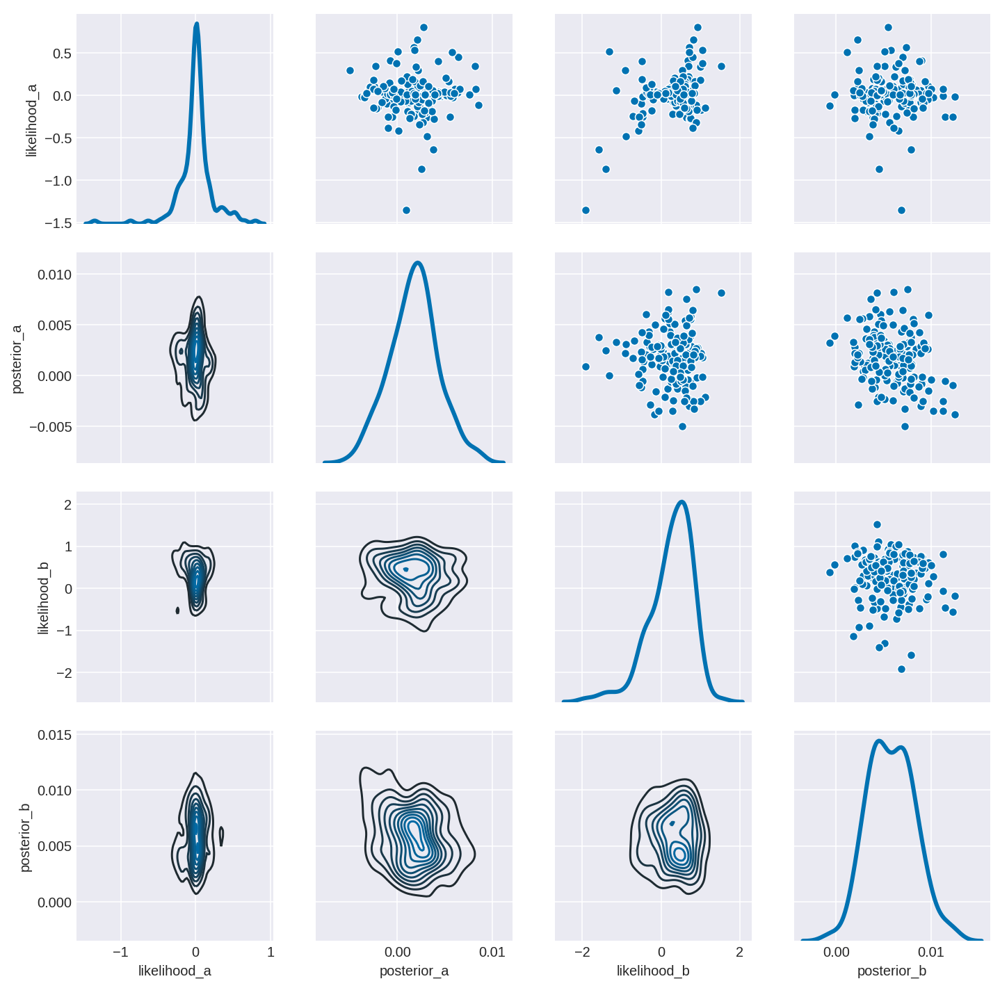

In [17]:
####################################
# convert params to pandas df
####################################

dictionary = {"likelihood_a":a1,
              'posterior_a':a2,
              'likelihood_b':b1,
              'posterior_b':b2}
parameterdf = pd.DataFrame(dictionary, index=unique_farm_idx)

g = sns.PairGrid(parameterdf, diag_sharey=False)
g.map_lower(sns.kdeplot)
g.map_upper(sns.scatterplot)
g.map_diag(sns.kdeplot, lw=3);

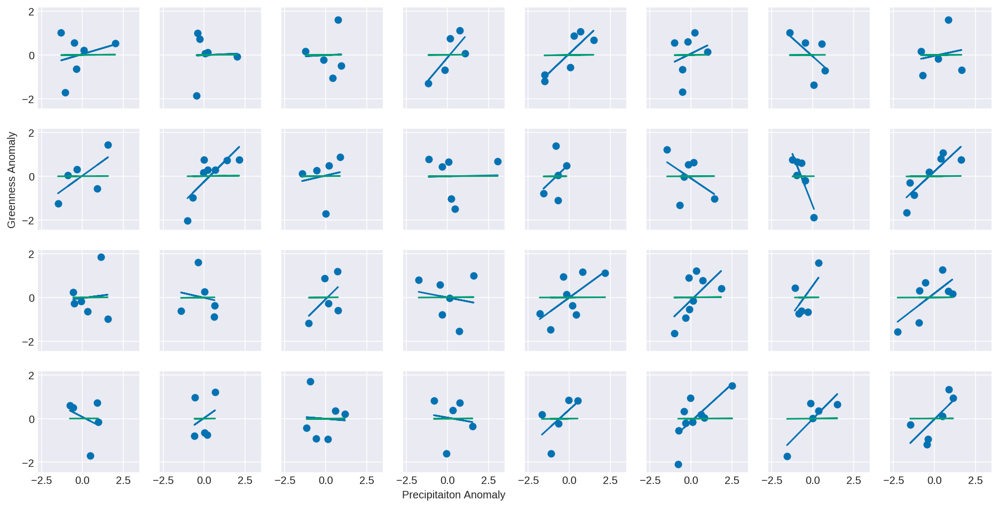

In [19]:
fig, ax = plt.subplots(nrows=4,ncols=8,sharex=True,sharey=True, figsize=(16,8))
num=0  # farm number to start at. Can go up to 163-ncols
count = num # start count at initial farm  
for i,farm in enumerate(range(num,num+8)):
    for j,farmj in enumerate(range(num,num+4)):
        count += 1
        dfp = df.loc[df.farm==count]
        x = dfp.zprsum3
        ax[j,i].scatter(x,dfp.zNDVIsum3)

        ax[j,i].plot(x, a1[count]+b1[count]*x)
        ax[j,i].plot(x, a2[count]+b2[count]*x)
        ax[3,3].set_xlabel('Precipitaiton Anomaly')
        ax[1,0].set_ylabel('Greenness Anomaly');

The bayesian hierarchical model is shrinking a lot. It doesn't trust the signal from the farm, and is basically giving every farm the average slope/intercept from the higher level. This is quite a lot different then my simple emperical bayes is doing. 

In [377]:
from matplotlib.patches import Ellipse
from scipy.stats import chi2
def Gauss2d(mu, cov, ci, ax=None):
    """Copied from statsmodel"""
    if ax is None:
        _, ax = plt.subplots(figsize=(6, 6))

    v_, w = np.linalg.eigh(cov)
    u = w[0] / np.linalg.norm(w[0])
    angle = np.arctan(u[1]/u[0])
    angle = 180 * angle / np.pi # convert to degrees

    for level in ci:
        v = 2 * np.sqrt(v_ * chi2.ppf(level, 2)) #get size corresponding to level
        ell = Ellipse(mu[:2], v[0], v[1], 180 + angle, facecolor='None',
                      edgecolor='k',
                      alpha=(1-level)*.5,
                      lw=1.5)
        ell.set_clip_box(ax.bbox)
        ell.set_alpha(0.5)
        ax.add_artist(ell)
    
    return ax

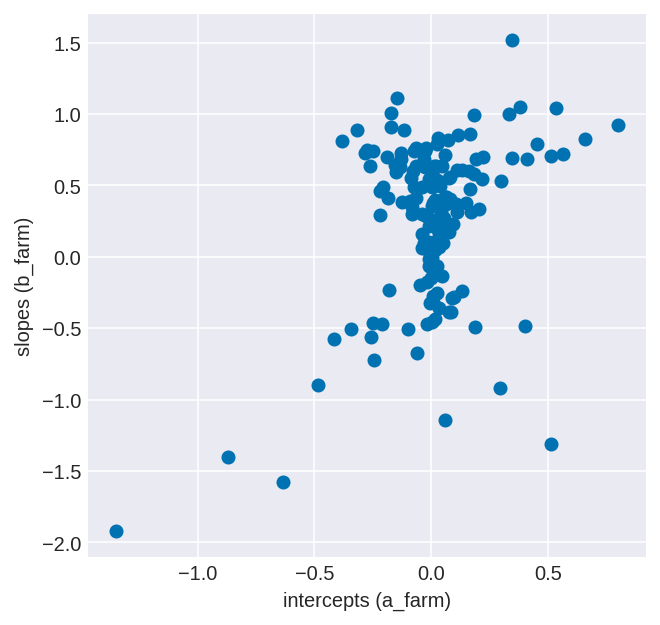

In [385]:
_, ax = plt.subplots(1, 1, figsize=(5, 5))
ax.scatter(a1, b1)
ax.set_xlabel('intercepts (a_farm)')
ax.set_ylabel('slopes (b_farm)');

Text(0, 0.5, 'slope')

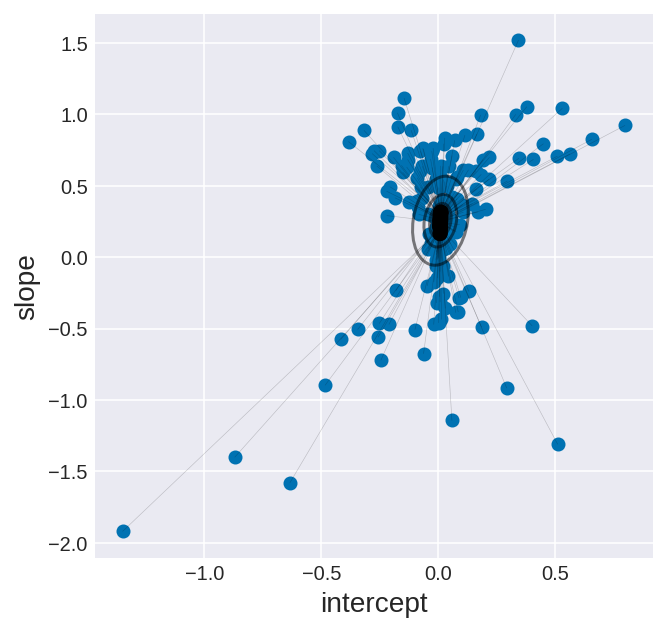

In [384]:
# compute posterior mean bivariate Gaussian
Mu_est = trace_2['ab'].mean(axis=0)
Chol_cov = trace_2['chol_cov'].mean(axis=0)
L_chol = np.zeros((2, 2))
L_chol[np.triu_indices(2, 0)] = Chol_cov
Sigma_est = np.dot(L_chol, L_chol.T)
# draw contours
_, ax = plt.subplots(1, 1, figsize=(5, 5))
Gauss2d(Mu_est, np.asarray(Sigma_est), [0.1, 0.3, 0.5, 0.8, 0.99], ax=ax)
ax.scatter(a1, b1)
ax.scatter(a2, b2, 
           facecolors='none', edgecolors='k', lw=1)
ax.plot([a1, a2], [b1, b2], 'k-', alpha=.2, lw=.3)
ax.set_xlabel('intercept', fontsize=14)
ax.set_ylabel('slope', fontsize=14);


###### Redoing with larger dataset

Could it be the smaller df that is causing this shrinkage? Not enough variation in prior possibly.

In [59]:
datapath = '/home/brian/WesternWheat/Data/Processed/maxdf_labeled_24.csv'
datapath = '/home/brian/WesternWheat/Data/Processed/stripped_max_labeled_df_23.csv'



df = pd.read_csv(datapath)

In [63]:
#df = df[df.cluster==4]
pd.unique(df.pixel).size

874

In [64]:
farm_idx = df.pixel.values.astype(int)
unique_farm_idx = np.unique(farm_idx)
N_farms = pd.unique(df.pixel).size

print ("unique number of farms: \n", N_farms)
print ("\naverage observations per farm: \n", np.round(farm_idx.size/N_farms,1))

unique number of farms: 
 874

average observations per farm: 
 6.0


In [65]:
farm_idx = df.pixel.values.astype(int)
unique_farm_idx = np.unique(farm_idx)
N_farms = pd.unique(df.pixel).size

print ("unique number of farms: \n", N_farms)
print ("\naverage observations per farm: \n", np.round(farm_idx.size/N_farms,1))
#####################################
# reindexing pixels from 0-Nfarms
#####################################

zero_farm_idx = np.zeros_like(farm_idx)

for i,farm in enumerate(unique_farm_idx):
        for j in np.where(farm_idx == farm): 
            zero_farm_idx[j] = i   
            
##########################################################
# This keeps order only becuase df is sorted by farm_idx
#########################################################

df['farm'] = zero_farm_idx
#df.farm.head(10)


In [70]:


with pm.Model() as normal:
    sd_dist = pm.HalfCauchy.dist(beta=2) # This is the same as sigma_cafe ~ dcauchy(0,2)
    packed_chol = pm.LKJCholeskyCov('chol_cov', eta=2, n=2, sd_dist=sd_dist)
    
    # compute the covariance matrix
    chol = pm.expand_packed_triangular(2, packed_chol, lower=True)
    cov = tt.dot(chol, chol.T)
    
    # Extract the standard deviations and rho
    sigma_ab = pm.Deterministic('sigma_farm', tt.sqrt(tt.diag(cov)))
    corr = tt.diag(sigma_ab**-1).dot(cov.dot(tt.diag(sigma_ab**-1)))
    r = pm.Deterministic('Rho', corr[np.triu_indices(2, k=1)])
    
    ab = pm.Normal('ab', mu=0, sd=10, shape=2)  # prior for average intercept and slope
    ab_farm = pm.MvNormal('ab_farm', mu=ab, chol=chol, shape=(N_farms, 2)) # Population of varying effects
    # Shape needs to be (N_farm, 2) because we're getting back both a and b for each cafe
    
    mu = ab_farm[:, 0][zero_farm_idx] + ab_farm[:, 1][zero_farm_idx] * df.zprsum3.values  # linear model
    sd = pm.Uniform('sigma', 0,2)      # prior stddev within cafes
    NDVI = pm.Normal('NDVI', mu=mu, sd=sd, observed=df.zNDVIsum3)  # likelihood


with pm.Model() as normal:
    sd_dist = pm.HalfCauchy.dist(beta=2) # This is the same as sigma_cafe ~ dcauchy(0,2)
    packed_chol = pm.LKJCholeskyCov('chol_cov', eta=2, n=2, sd_dist=sd_dist)
    
    # compute the covariance matrix
    chol = pm.expand_packed_triangular(2, packed_chol, lower=True)
    #cov = tt.dot(chol, chol.T)
    
    # Extract the standard deviations and rho
    #sigma_ab = pm.Deterministic('sigma_farm', tt.sqrt(tt.diag(cov)))
    #corr = tt.diag(sigma_ab**-1).dot(cov.dot(tt.diag(sigma_ab**-1)))
    #r = pm.Deterministic('Rho', corr[np.triu_indices(2, k=1)])
    
    ab = pm.Normal('ab', mu=0, sd=10, shape=2)  # prior for average intercept and slope
    ab_farm = pm.MvNormal('ab_farm', mu=ab, chol=chol, shape=(N_farms, 2)) # Population of varying effects
    # Shape needs to be (N_farm, 2) because we're getting back both a and b for each cafe
    
    mu = ab_farm[:, 0][zero_farm_idx] + ab_farm[:, 1][zero_farm_idx] * df.zprsum3.values  # linear model
    sd = pm.Uniform('sigma', 0,2)      # prior stddev within cafes
    NDVI = pm.StudentT('NDVI', nu=5, mu=mu, sd=sd, observed=df.zNDVIsum3)  # likelihood
    


In [ ]:
with student:
    trace_student= pm.sample(5000,tune=1000)

In [ ]:
with normal:
    trace = pm.sample(5000, tune=1000)

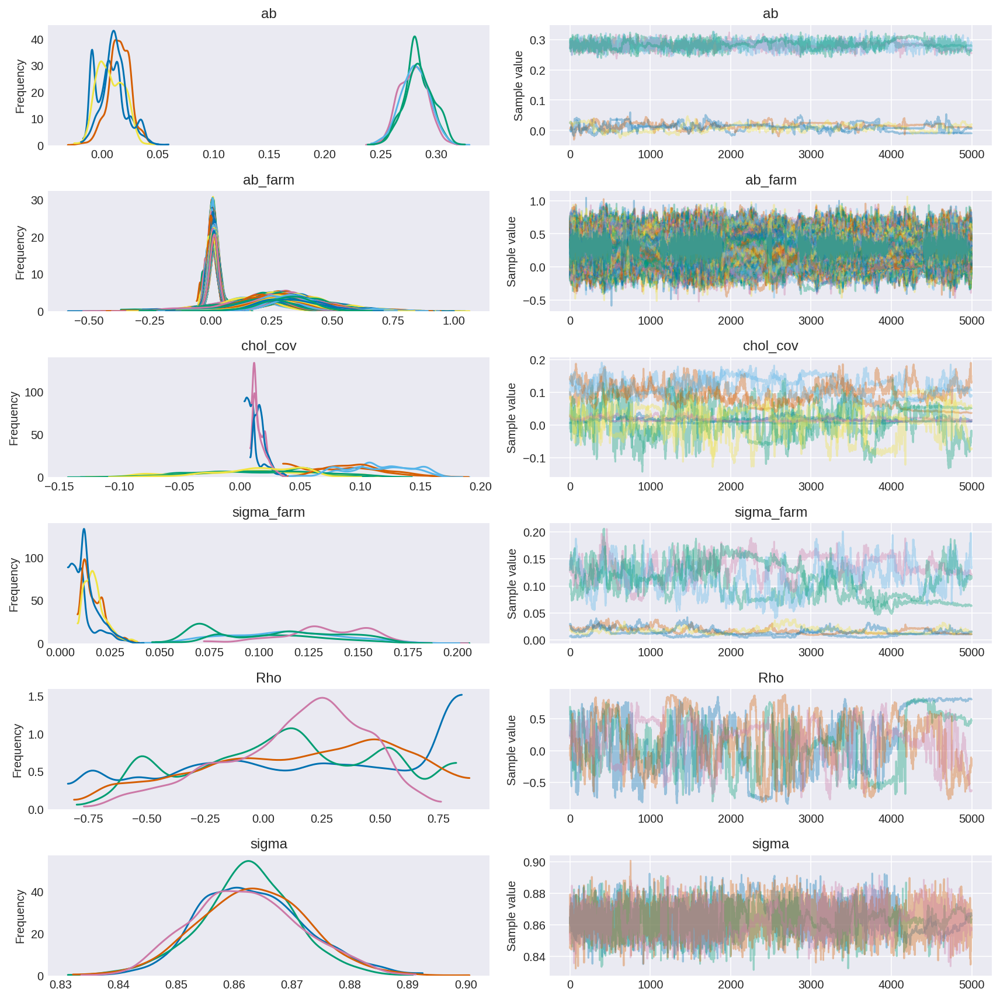

In [67]:
pm.traceplot(trace);

In [52]:
######
# OLS 
######

#############################################
# compute slope int directly from pixel level
##############################################
a1b1 = []    
for p in unique_farm_idx:
        mu_params,_ = linear_pixel(df,p,c=0,column_x='zprsum3',column_y='zNDVIsum3', cluster=False)
        a1b1.append(mu_params)
        
# OLS results
ab = np.array(a1b1)
a1, b1 = ab[:,0], ab[:,1]

# hierarchical results
# extract posterior means of partially pooled estimates
a2b2 = trace['ab_farm'].mean(axis=0)
a2 = a2b2[:, 0]
b2 = a2b2[:, 1]

(-2, 2)

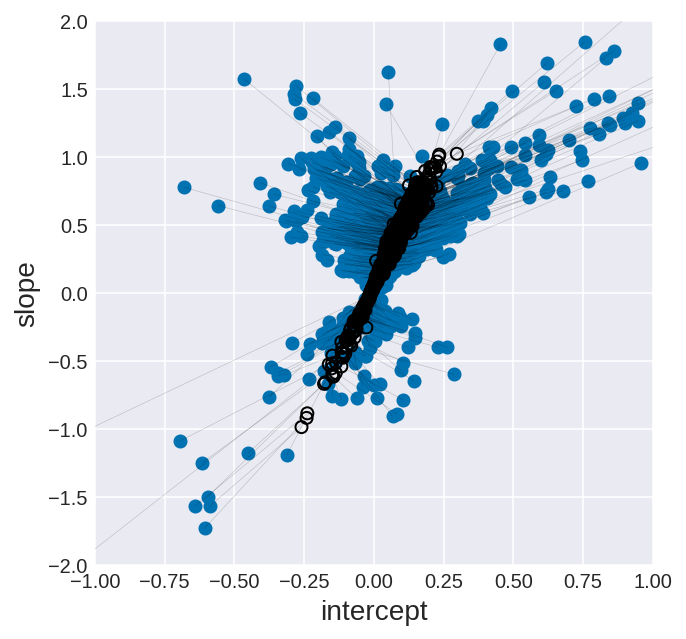

In [71]:
# compute posterior mean bivariate Gaussian
Mu_est = trace['ab'].mean(axis=0)
Chol_cov = trace['chol_cov'].mean(axis=0)
L_chol = np.zeros((2, 2))
L_chol[np.triu_indices(2, 0)] = Chol_cov
Sigma_est = np.dot(L_chol, L_chol.T)
# draw contours
_, ax = plt.subplots(1, 1, figsize=(5, 5))
#Gauss2d(Mu_est, np.asarray(Sigma_est), [0.1, 0.3, 0.5, 0.8, 0.99], ax=ax)
ax.scatter(a1, b1)
ax.scatter(a2, b2, 
           facecolors='none', edgecolors='k', lw=1)
ax.plot([a1, a2], [b1, b2], 'k-', alpha=.2, lw=.3)
ax.set_xlabel('intercept', fontsize=14)
ax.set_ylabel('slope', fontsize=14);
ax.set_xlim(-1,1)
ax.set_ylim(-2,2)